In [64]:
import pathlib

# Define data directory
train_dir = pathlib.Path('data/train')
test_dir = pathlib.Path('data/test')
train_masks_dir = pathlib.Path('external_contours_masks/train')
test_masks_dir = pathlib.Path('external_contours_masks/test')

In [65]:
# Convert all the images in train masks and test masks to png
import os
from PIL import Image

for img_path in train_masks_dir.glob('*.jpg'):
    os.remove(img_path)

for img_path in test_masks_dir.glob('*.jpg'):
    os.remove(img_path)

In [66]:
import os
import cv2
import numpy as np

# check if the pixels are normalized
img = cv2.imread(os.path.join(test_dir, 'P1MF1_C.Png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img), np.min(img))
img_mask = cv2.imread(os.path.join(test_masks_dir, 'P1MF1_C.Png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img_mask), np.min(img_mask))
print(img.shape, img_mask.shape)

255 0
233 0
(4096, 4096) (4096, 4096)


In [67]:
X_train = []
y_train = []
X_test = []
y_test = []

for img_path in train_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_train.append(img)
    mask_path = os.path.join(train_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_train.append(img_mask)

for img_path in test_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_test.append(img)
    mask_path = os.path.join(test_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_test.append(img_mask)

X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

# # Expand the dimensions of the images
#X_train = np.expand_dims(X_train, axis = 3)
y_train = np.expand_dims(y_train, axis = 3)
#X_test = np.expand_dims(X_test, axis = 3)
y_test = np.expand_dims(y_test, axis = 3)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(50, 256, 256, 3) (50, 256, 256, 1)
(13, 256, 256, 3) (13, 256, 256, 1)


In [68]:
import tensorflow as tf

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

In [69]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask = tf.round(tf.cast(input_mask, tf.float32) / 255.0)
    return input_image, input_mask

def load_image(input_image, input_mask):
    input_image = tf.image.resize(input_image, (128, 128))
    input_mask = tf.image.resize(input_mask,(128, 128), method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

In [70]:
TRAIN_LENGTH = len(X_train)
BATCH_SIZE = 8
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [71]:
train_ds = train_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_ds = test_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

print("the shape of the train dataset is: ", train_ds)
# Show the labels of the first image
for image, mask in train_ds.take(1):
    print(" median value of the image is: ", np.median(mask.numpy()))
    # print("the shape of the image is: ", image.numpy().shape)
    # print("the shape of the mask is: ", mask.numpy().shape)
    # print("the label of the first image is: ", mask.numpy())

the shape of the train dataset is:  <_ParallelMapDataset element_spec=(TensorSpec(shape=(128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(128, 128, 1), dtype=tf.float32, name=None))>
 median value of the image is:  1.0


In [72]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    # do augmentation in ratio of 1 to 5 images in the train
    self.augment_inputs = tf.keras.Sequential([
        # tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
        # tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
        # tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
        # tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, seed=seed),
        # tf.keras.layers.RandomContrast(factor=0.2, seed=seed),
    ], name="augment_inputs")

    self.augment_labels = tf.keras.Sequential([
        # tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
        # tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
        # tf.keras.layers.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
        # tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2, seed=seed),
    ], name="augment_labels")

  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

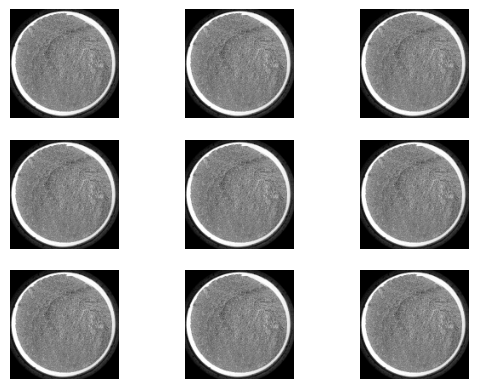

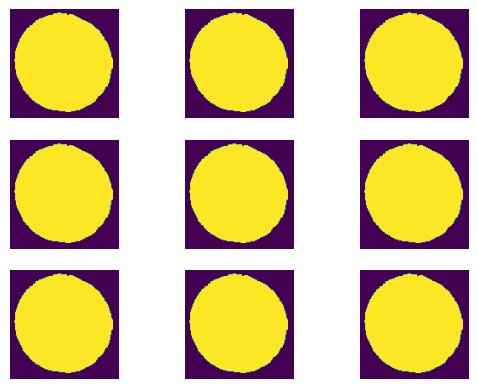

In [73]:
from matplotlib import pyplot as plt
# plot 9 augmentations of the image and the mask for one original image and its mask
for image, mask in train_ds.take(1):
    # random seed array
    seed = np.random.randint(0, 1000, 9)
    for i in range(9):
        plt.subplot(330 + 1 + i)
        augmented_image, augmented_mask = Augment(seed[i])(image, mask)
        plt.imshow(augmented_image.numpy())
        plt.axis("off")
    plt.show()
    for i in range(9):
        plt.subplot(330 + 1 + i)
        augmented_image, augmented_mask = Augment(seed[i])(image, mask)
        plt.imshow(augmented_mask.numpy())
        plt.axis("off")
    plt.show()

In [74]:
train_batches = (
    train_ds
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_ds.batch(BATCH_SIZE)

In [75]:
from matplotlib import pyplot as plt

def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    # print the unique values of the image
    #print(np.unique(display_list[i]))
    plt.axis('off')
  plt.show()

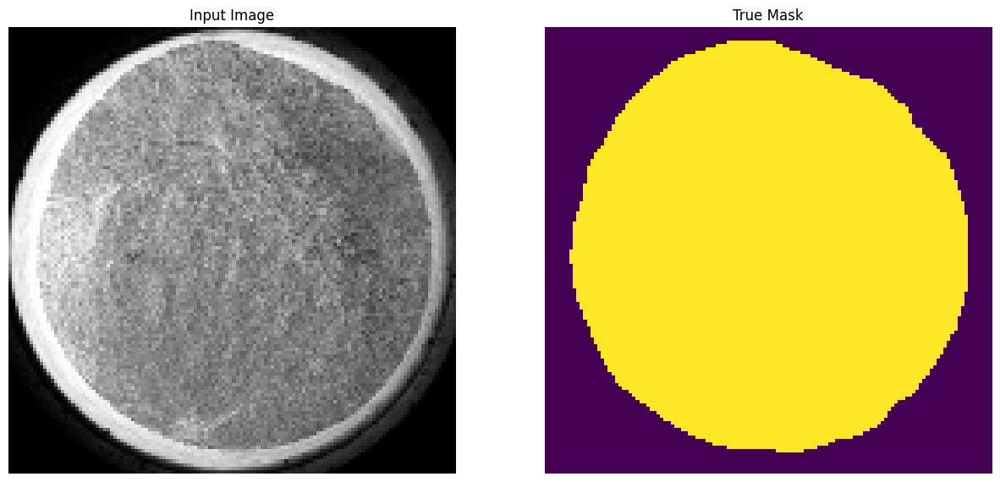

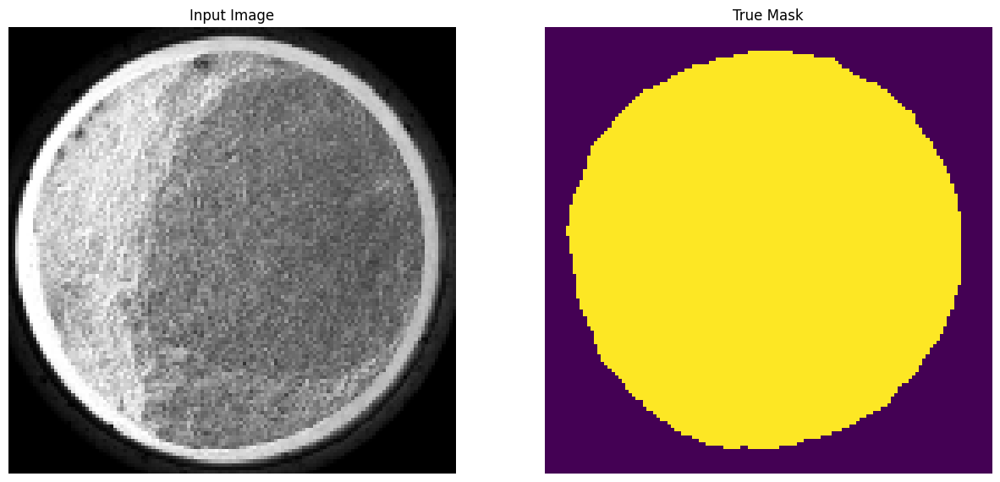

In [76]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

In [77]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

# Make the last two layers trainable, but keep the rest frozen
for layer in down_stack.layers:  # Exclude the last two layers
    layer.trainable = False

# # Now, set the last two layers to be trainable
# for layer in down_stack.layers[-1:]:
#     layer.trainable = True

In [78]:
from tensorflow_examples.models.pix2pix import pix2pix

up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
    pix2pix.upsample(32, 3),   # 64x64 -> 128x128
]

# Make the last two layers of the up_stack trainable, but keep the rest frozen
# for layer in up_stack[0:0]:  # Exclude the last two layers
#     layer.trainable = False

# # Now, set the last two layers to be trainable
for layer in up_stack:
    layer.trainable = True


In [79]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [80]:
# Try the model
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [81]:
class WeightedSCCE(tf.keras.losses.Loss):
    def __init__(self, class_weight, from_logits=False, name='weighted_scce'):
        if class_weight is None or all(v == 1. for v in class_weight):
            self.class_weight = None
        else:
            self.class_weight = tf.convert_to_tensor(class_weight,
                dtype=tf.float32)
        self.name = name
        self.reduction = tf.keras.losses.Reduction.NONE
        self.unreduced_scce = tf.keras.losses.SparseCategoricalCrossentropy(
            from_logits=from_logits, name=name,
            reduction=self.reduction)

    def __call__(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, dtype=tf.int32)
        loss = self.unreduced_scce(y_true, y_pred, sample_weight)
        if self.class_weight is not None:
            weight_mask = tf.gather(self.class_weight, y_true)
            loss = tf.math.multiply(loss, weight_mask)
        return loss


In [82]:
import tensorflow as tf
# Assuming OUTPUT_CLASSES is the number of classes in your segmentation task
OUTPUT_CLASSES = 2

# Create the U-Net model
model = unet_model(output_channels=OUTPUT_CLASSES)

# Compile the model
model.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [83]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 [==============================] - 1s 751ms/step


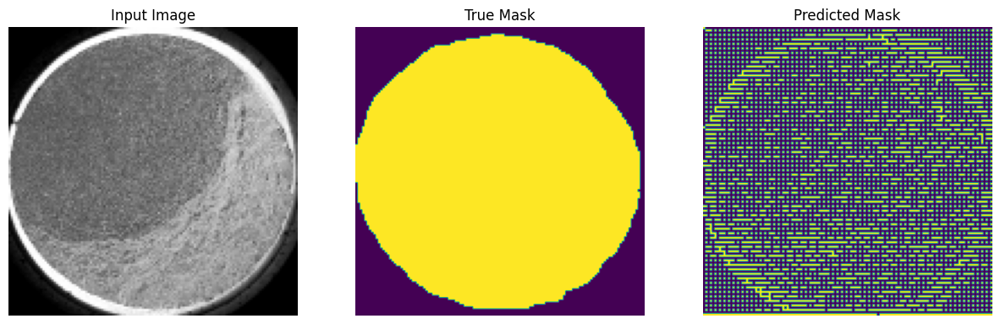

1/1 [==============================] - 0s 200ms/step


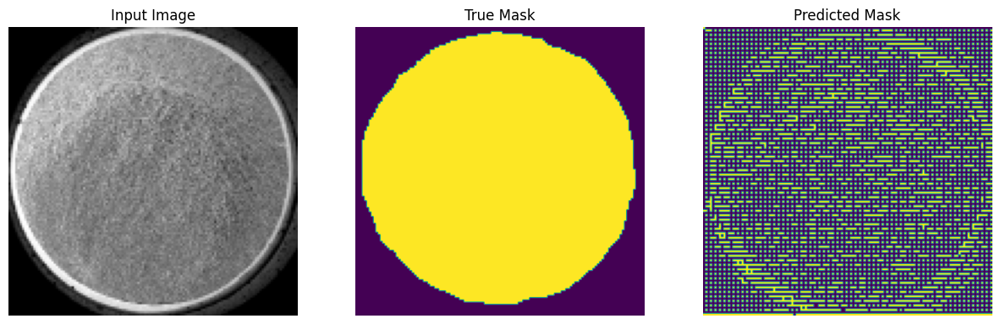

1/1 [==============================] - 0s 196ms/step


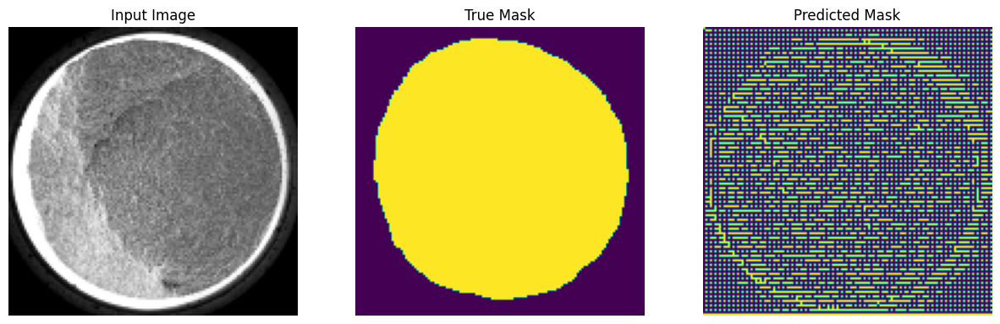

In [84]:
show_predictions(train_batches, 3)

In [85]:
from IPython.display import clear_output

class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=True)
    show_predictions(train_batches, 1)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/200
1/1 [==============================] - 0s 160ms/step


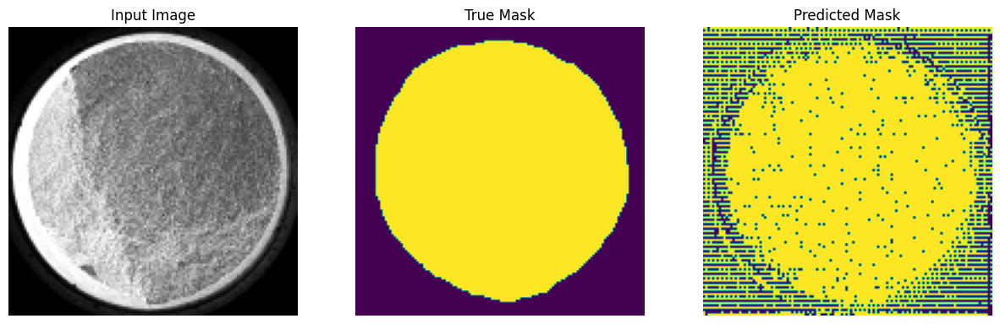


Sample Prediction after epoch 1

6/6 [==============================] - 5s 554ms/step - loss: 0.7452 - accuracy: 0.6473 - val_loss: 0.5442 - val_accuracy: 0.7530
Epoch 2/200
1/1 [==============================] - 0s 152ms/step


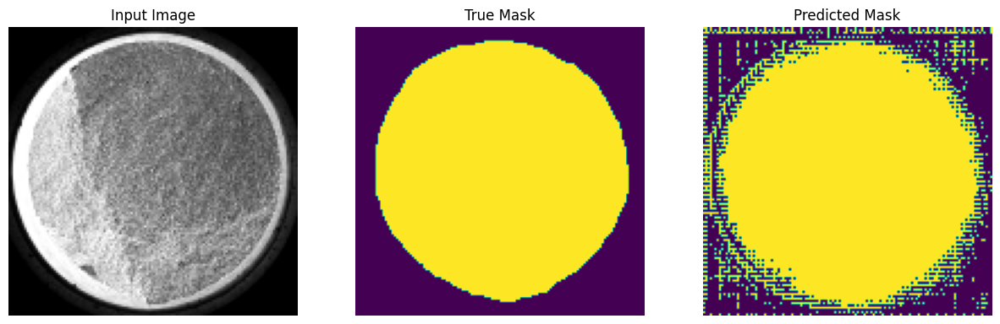


Sample Prediction after epoch 2

6/6 [==============================] - 2s 402ms/step - loss: 0.4191 - accuracy: 0.8081 - val_loss: 0.3073 - val_accuracy: 0.8871
Epoch 3/200
1/1 [==============================] - 0s 160ms/step


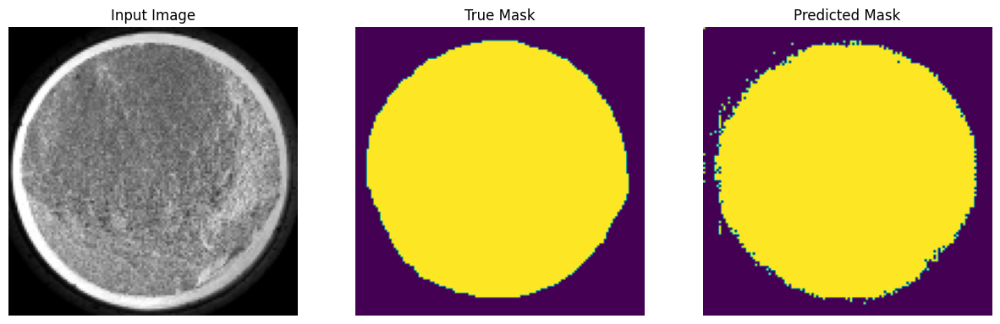


Sample Prediction after epoch 3

6/6 [==============================] - 2s 326ms/step - loss: 0.2352 - accuracy: 0.9315 - val_loss: 0.1291 - val_accuracy: 0.9709
Epoch 4/200
1/1 [==============================] - 0s 153ms/step


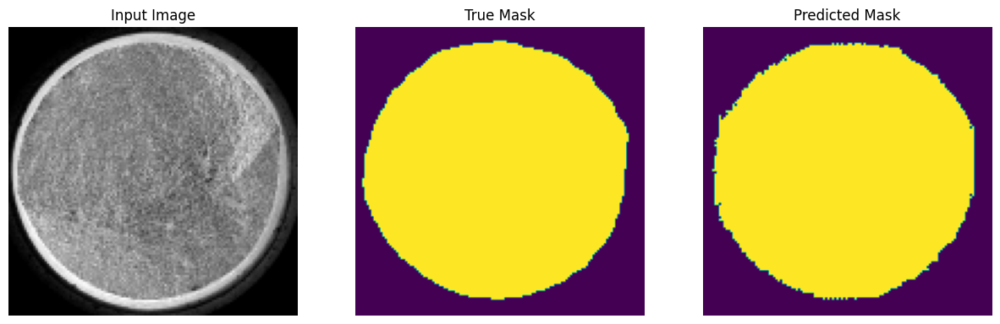


Sample Prediction after epoch 4

6/6 [==============================] - 2s 316ms/step - loss: 0.1534 - accuracy: 0.9715 - val_loss: 0.0843 - val_accuracy: 0.9768
Epoch 5/200
1/1 [==============================] - 0s 146ms/step


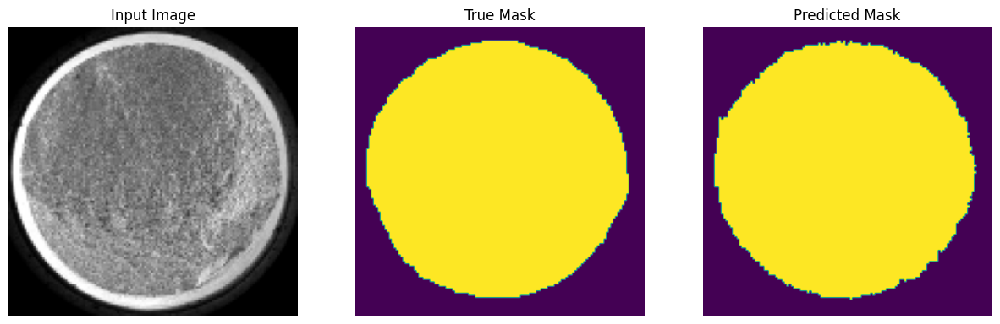


Sample Prediction after epoch 5

6/6 [==============================] - 2s 320ms/step - loss: 0.1134 - accuracy: 0.9780 - val_loss: 0.0566 - val_accuracy: 0.9821
Epoch 6/200
1/1 [==============================] - 0s 157ms/step


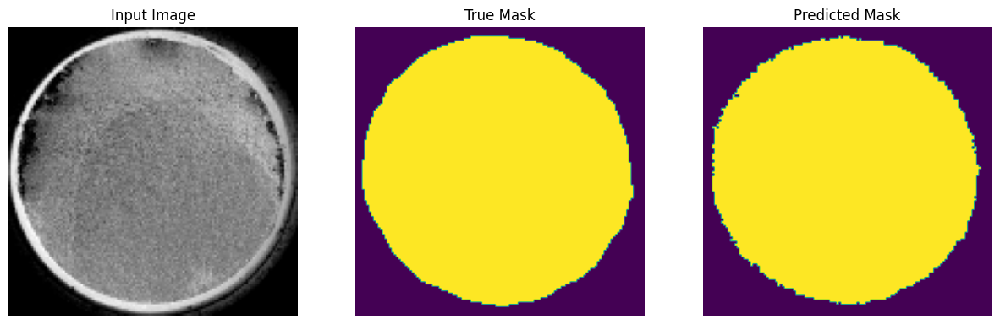


Sample Prediction after epoch 6

6/6 [==============================] - 2s 329ms/step - loss: 0.0832 - accuracy: 0.9822 - val_loss: 0.0462 - val_accuracy: 0.9837
Epoch 7/200
1/1 [==============================] - 0s 147ms/step


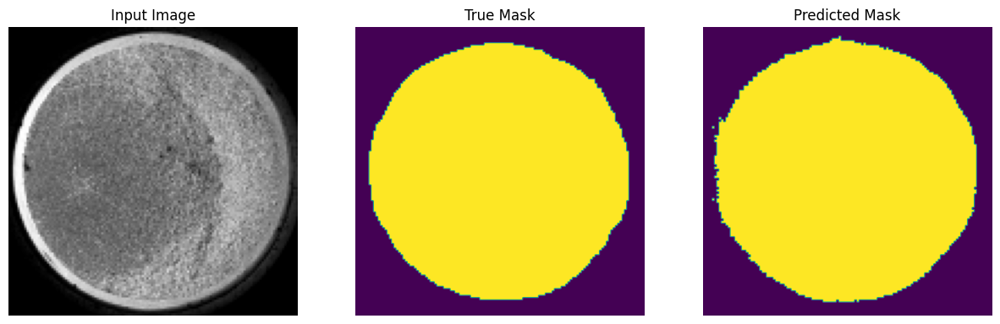


Sample Prediction after epoch 7

6/6 [==============================] - 2s 316ms/step - loss: 0.0685 - accuracy: 0.9830 - val_loss: 0.0508 - val_accuracy: 0.9818
Epoch 8/200
1/1 [==============================] - 0s 150ms/step


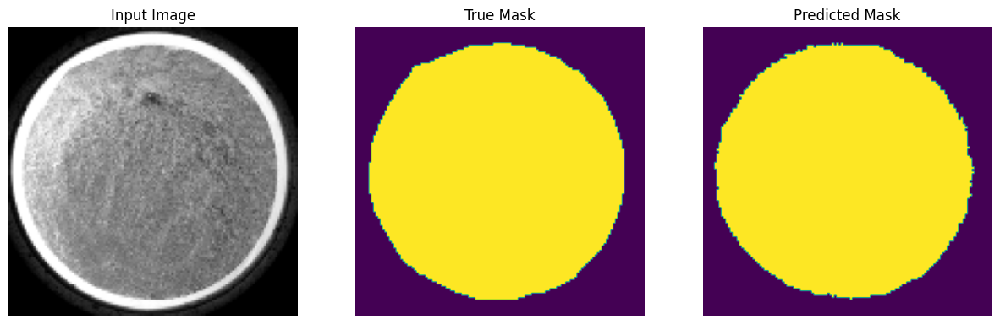


Sample Prediction after epoch 8

6/6 [==============================] - 2s 363ms/step - loss: 0.0570 - accuracy: 0.9852 - val_loss: 0.0421 - val_accuracy: 0.9846
Epoch 9/200
1/1 [==============================] - 0s 184ms/step


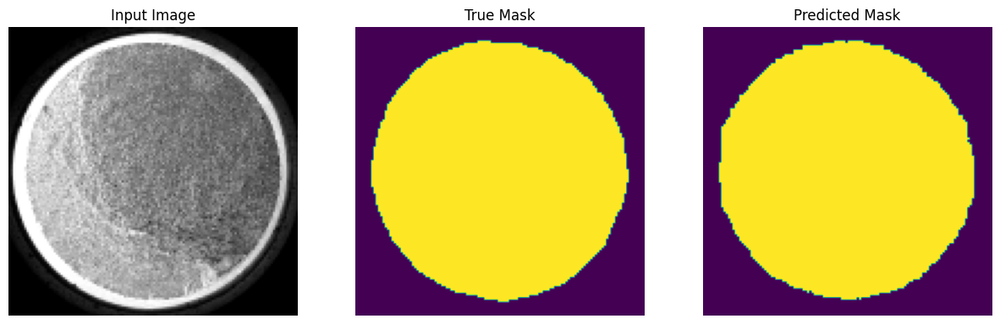


Sample Prediction after epoch 9

6/6 [==============================] - 2s 361ms/step - loss: 0.0512 - accuracy: 0.9858 - val_loss: 0.0385 - val_accuracy: 0.9858
Epoch 10/200
1/1 [==============================] - 0s 148ms/step


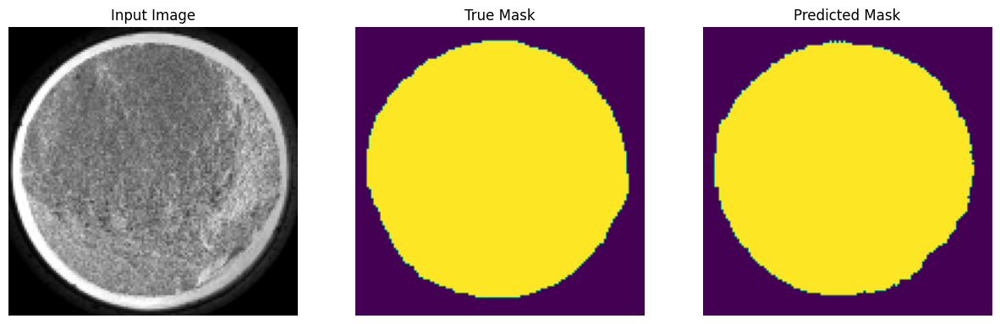


Sample Prediction after epoch 10

6/6 [==============================] - 2s 334ms/step - loss: 0.0469 - accuracy: 0.9865 - val_loss: 0.0436 - val_accuracy: 0.9838
Epoch 11/200
1/1 [==============================] - 0s 177ms/step


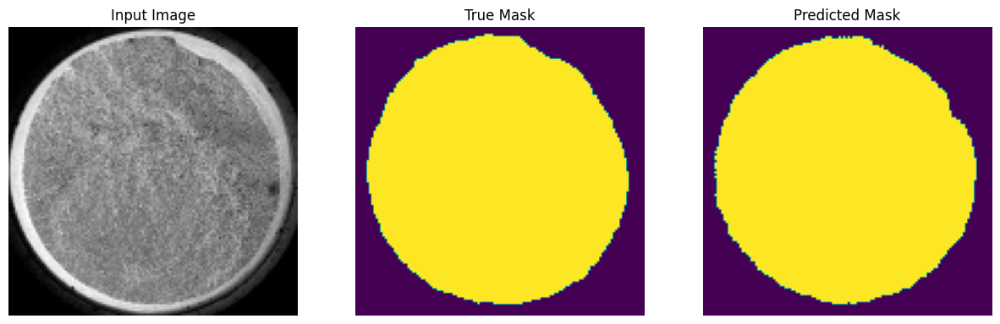


Sample Prediction after epoch 11

6/6 [==============================] - 2s 335ms/step - loss: 0.0429 - accuracy: 0.9873 - val_loss: 0.0365 - val_accuracy: 0.9863
Epoch 12/200
1/1 [==============================] - 0s 160ms/step


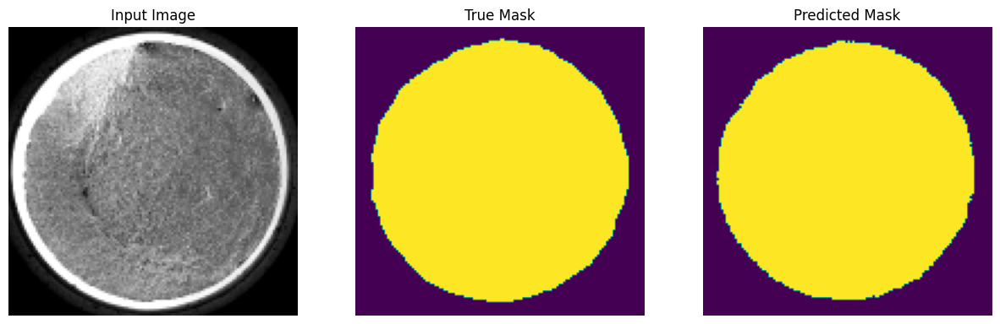


Sample Prediction after epoch 12

6/6 [==============================] - 2s 315ms/step - loss: 0.0406 - accuracy: 0.9874 - val_loss: 0.0374 - val_accuracy: 0.9863
Epoch 13/200
1/1 [==============================] - 0s 151ms/step


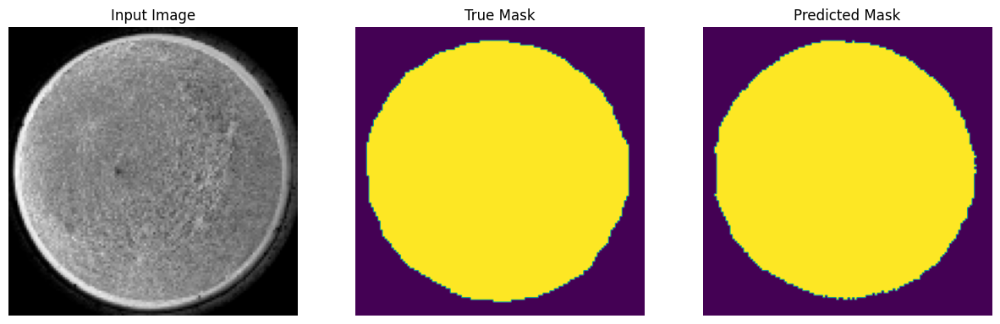


Sample Prediction after epoch 13

6/6 [==============================] - 2s 365ms/step - loss: 0.0386 - accuracy: 0.9881 - val_loss: 0.0451 - val_accuracy: 0.9832
Epoch 14/200
1/1 [==============================] - 0s 151ms/step


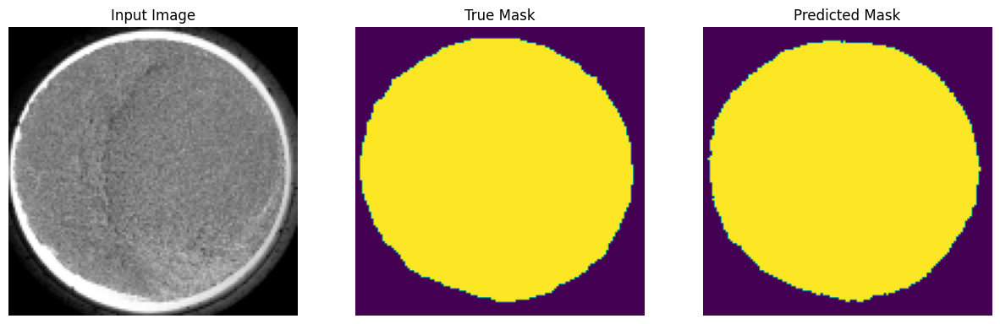


Sample Prediction after epoch 14

6/6 [==============================] - 2s 329ms/step - loss: 0.0374 - accuracy: 0.9880 - val_loss: 0.0389 - val_accuracy: 0.9853
Epoch 15/200
1/1 [==============================] - 0s 144ms/step


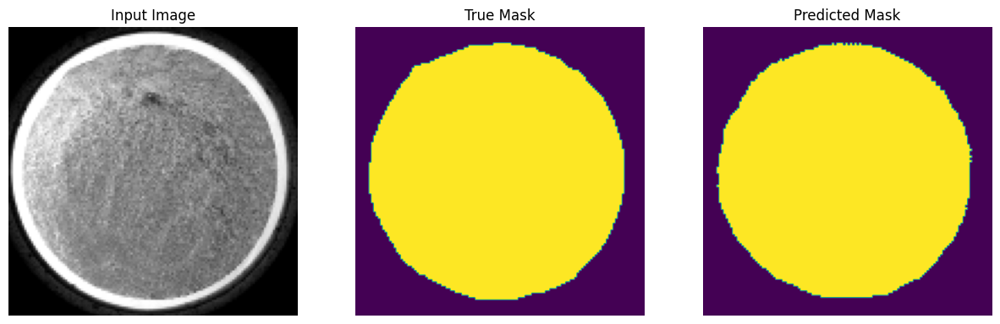


Sample Prediction after epoch 15

6/6 [==============================] - 2s 350ms/step - loss: 0.0359 - accuracy: 0.9883 - val_loss: 0.0369 - val_accuracy: 0.9864
Epoch 16/200
1/1 [==============================] - 0s 137ms/step


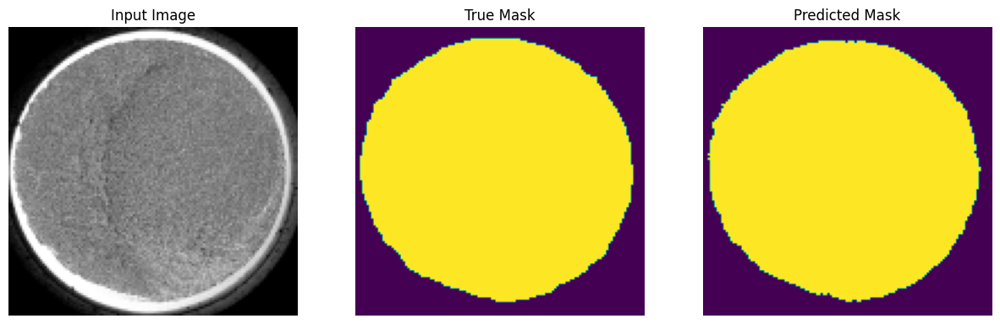


Sample Prediction after epoch 16

6/6 [==============================] - 2s 340ms/step - loss: 0.0344 - accuracy: 0.9885 - val_loss: 0.0368 - val_accuracy: 0.9862
Epoch 17/200
1/1 [==============================] - 0s 162ms/step


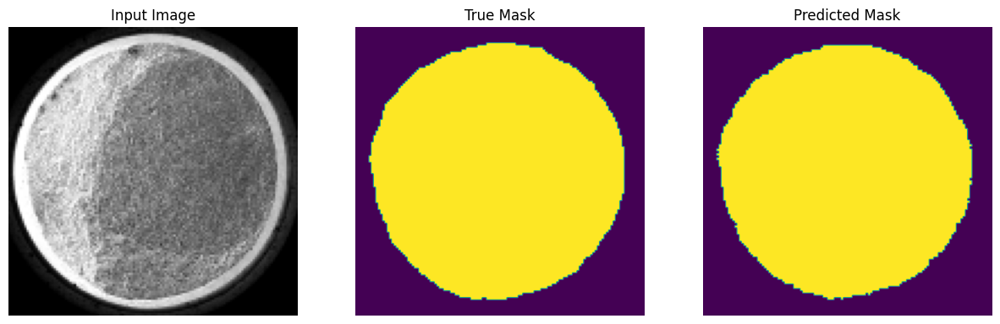


Sample Prediction after epoch 17

6/6 [==============================] - 2s 325ms/step - loss: 0.0325 - accuracy: 0.9890 - val_loss: 0.0371 - val_accuracy: 0.9862
Epoch 18/200
1/1 [==============================] - 0s 171ms/step


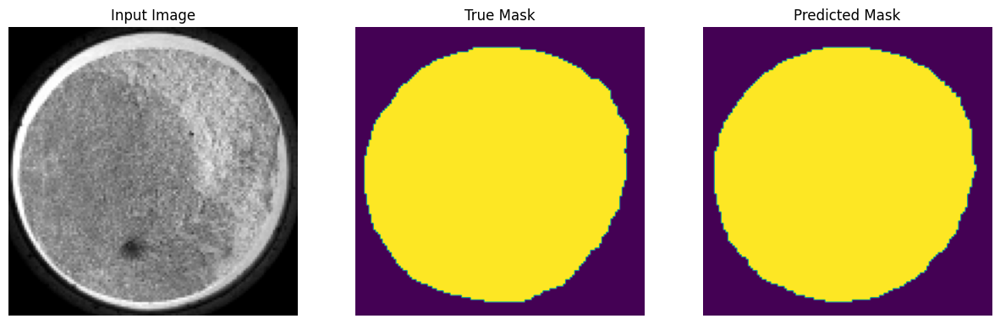


Sample Prediction after epoch 18

6/6 [==============================] - 2s 331ms/step - loss: 0.0318 - accuracy: 0.9893 - val_loss: 0.0345 - val_accuracy: 0.9872
Epoch 19/200
1/1 [==============================] - 0s 160ms/step


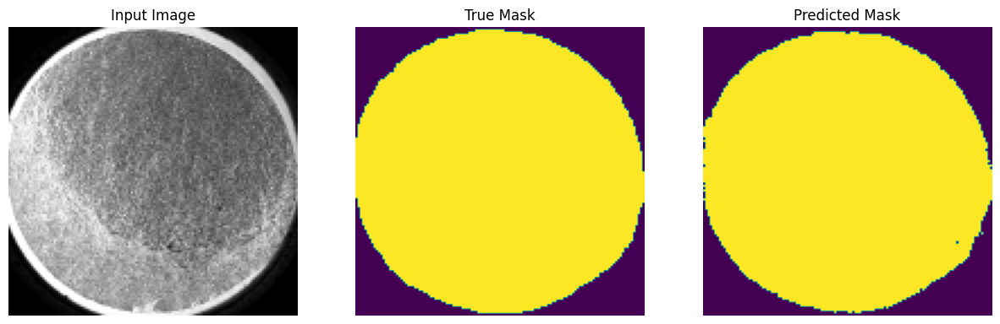


Sample Prediction after epoch 19

6/6 [==============================] - 2s 336ms/step - loss: 0.0332 - accuracy: 0.9883 - val_loss: 0.0332 - val_accuracy: 0.9876
Epoch 20/200
1/1 [==============================] - 0s 145ms/step


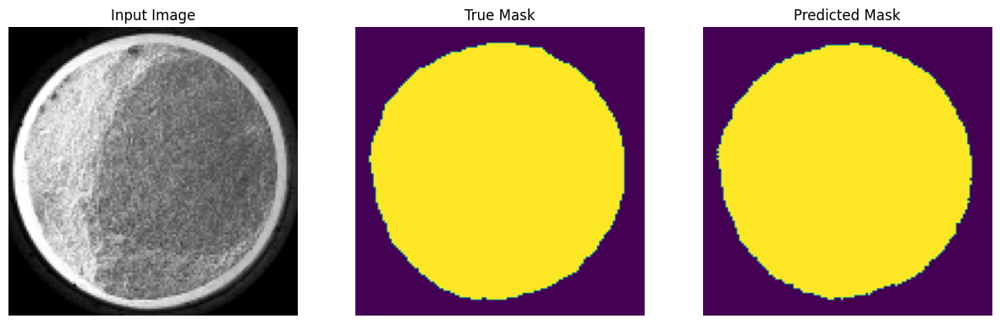


Sample Prediction after epoch 20

6/6 [==============================] - 2s 342ms/step - loss: 0.0292 - accuracy: 0.9898 - val_loss: 0.0372 - val_accuracy: 0.9863
Epoch 21/200
1/1 [==============================] - 0s 146ms/step


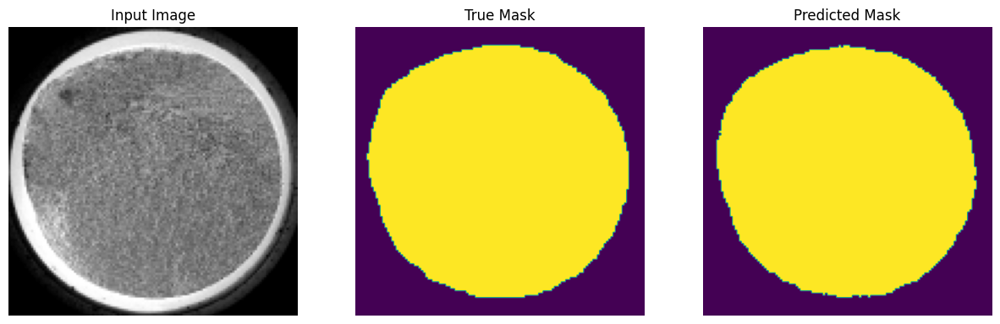


Sample Prediction after epoch 21

6/6 [==============================] - 2s 324ms/step - loss: 0.0291 - accuracy: 0.9898 - val_loss: 0.0381 - val_accuracy: 0.9853
Epoch 22/200
1/1 [==============================] - 0s 152ms/step


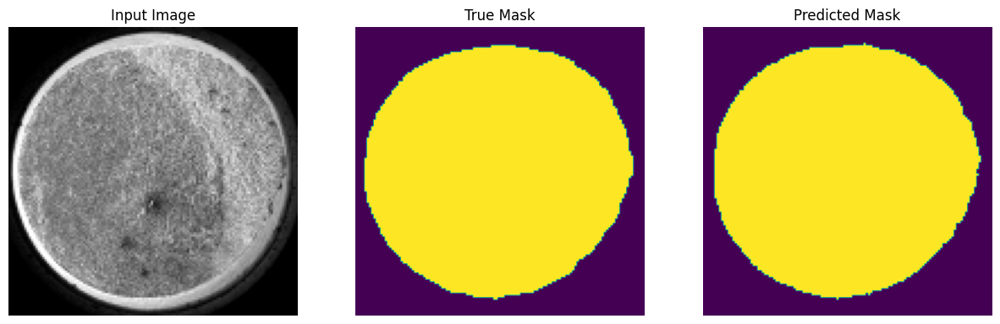


Sample Prediction after epoch 22

6/6 [==============================] - 2s 354ms/step - loss: 0.0284 - accuracy: 0.9899 - val_loss: 0.0319 - val_accuracy: 0.9879
Epoch 23/200
1/1 [==============================] - 0s 153ms/step


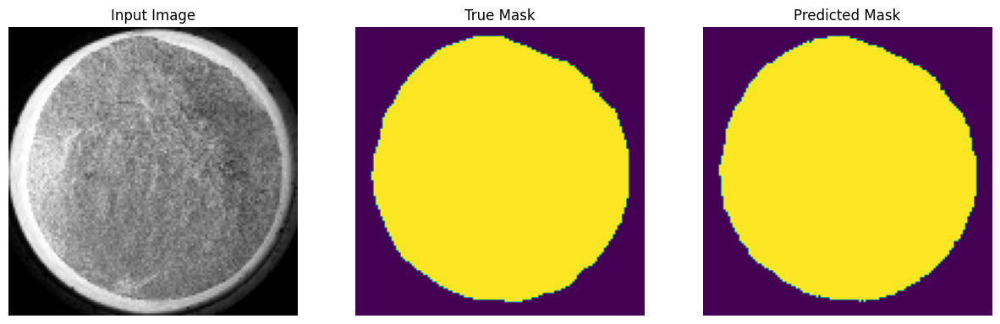


Sample Prediction after epoch 23

6/6 [==============================] - 2s 355ms/step - loss: 0.0277 - accuracy: 0.9903 - val_loss: 0.0329 - val_accuracy: 0.9874
Epoch 24/200
1/1 [==============================] - 0s 174ms/step


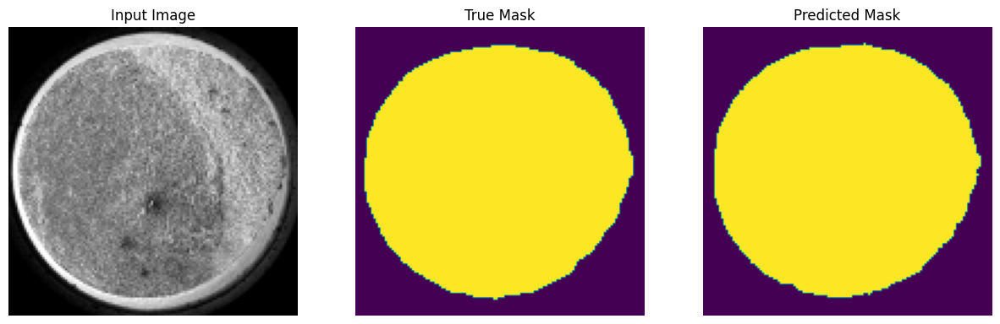


Sample Prediction after epoch 24

6/6 [==============================] - 2s 362ms/step - loss: 0.0271 - accuracy: 0.9904 - val_loss: 0.0318 - val_accuracy: 0.9882
Epoch 25/200
1/1 [==============================] - 0s 163ms/step


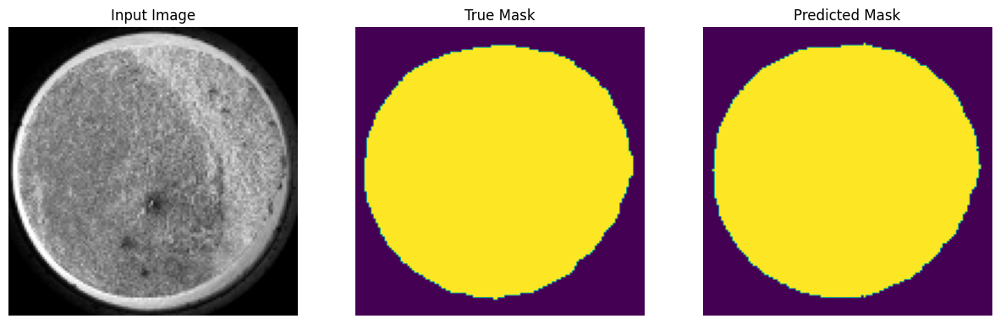


Sample Prediction after epoch 25

6/6 [==============================] - 2s 359ms/step - loss: 0.0254 - accuracy: 0.9910 - val_loss: 0.0297 - val_accuracy: 0.9891
Epoch 26/200
1/1 [==============================] - 0s 161ms/step


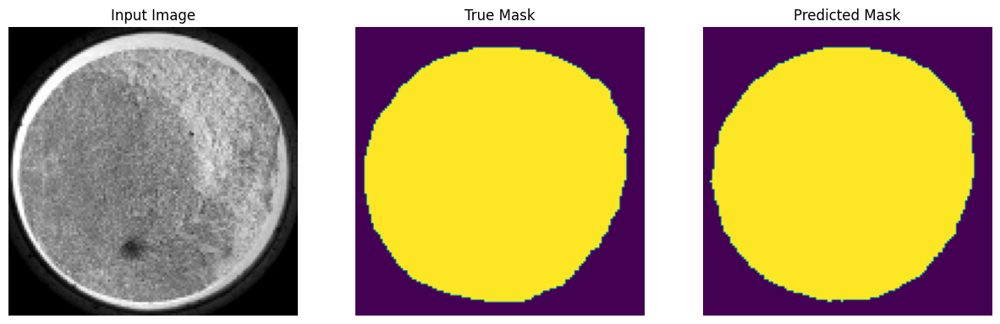


Sample Prediction after epoch 26

6/6 [==============================] - 2s 342ms/step - loss: 0.0265 - accuracy: 0.9905 - val_loss: 0.0324 - val_accuracy: 0.9879
Epoch 27/200
1/1 [==============================] - 0s 182ms/step


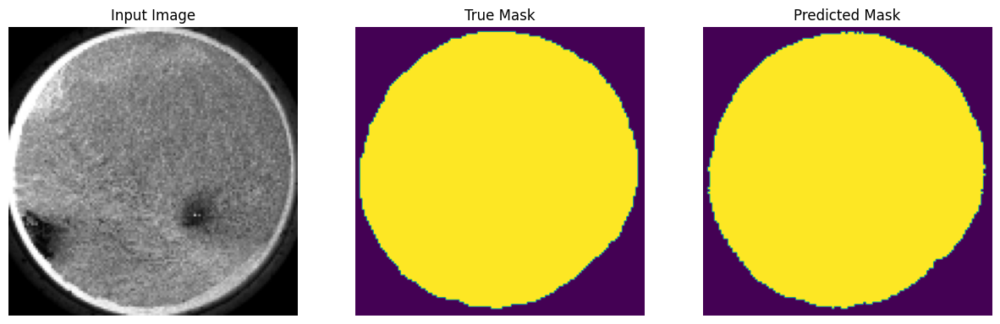


Sample Prediction after epoch 27

6/6 [==============================] - 2s 370ms/step - loss: 0.0246 - accuracy: 0.9911 - val_loss: 0.0336 - val_accuracy: 0.9871
Epoch 28/200
1/1 [==============================] - 0s 152ms/step


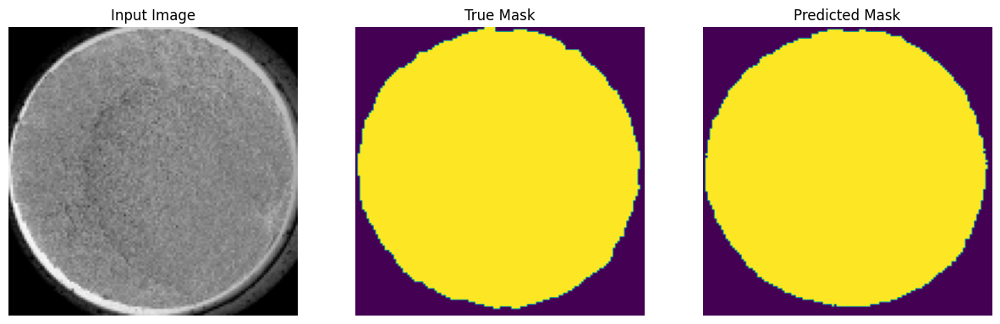


Sample Prediction after epoch 28

6/6 [==============================] - 2s 361ms/step - loss: 0.0240 - accuracy: 0.9913 - val_loss: 0.0331 - val_accuracy: 0.9877
Epoch 29/200
1/1 [==============================] - 0s 159ms/step


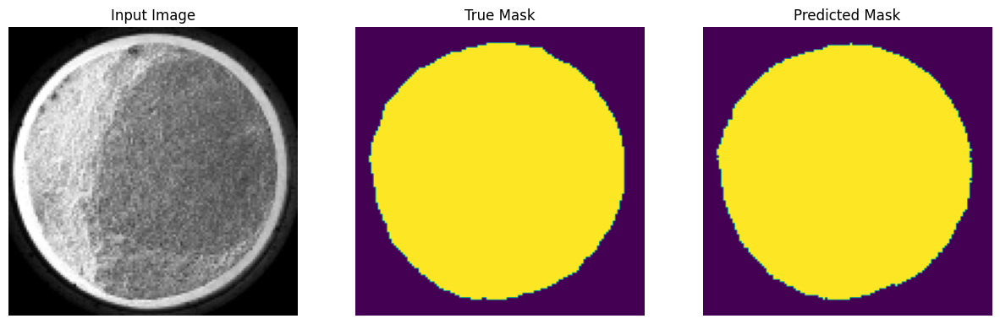


Sample Prediction after epoch 29

6/6 [==============================] - 2s 384ms/step - loss: 0.0256 - accuracy: 0.9905 - val_loss: 0.0348 - val_accuracy: 0.9866
Epoch 30/200
1/1 [==============================] - 0s 186ms/step


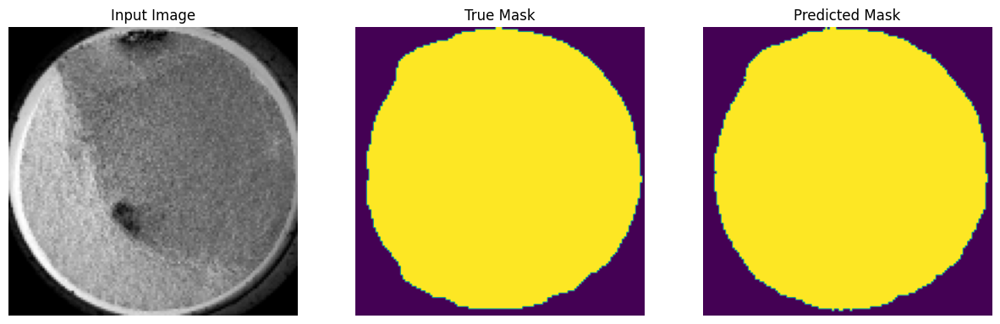


Sample Prediction after epoch 30

6/6 [==============================] - 2s 422ms/step - loss: 0.0242 - accuracy: 0.9912 - val_loss: 0.0316 - val_accuracy: 0.9882
Epoch 31/200
1/1 [==============================] - 0s 158ms/step


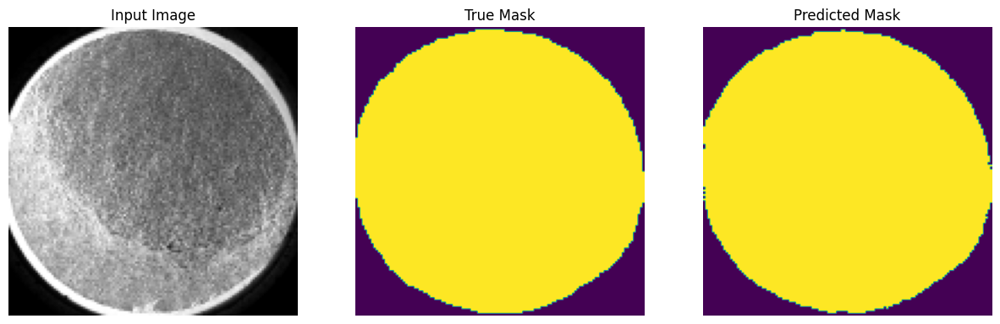


Sample Prediction after epoch 31

6/6 [==============================] - 2s 365ms/step - loss: 0.0230 - accuracy: 0.9914 - val_loss: 0.0292 - val_accuracy: 0.9889
Epoch 32/200
1/1 [==============================] - 0s 192ms/step


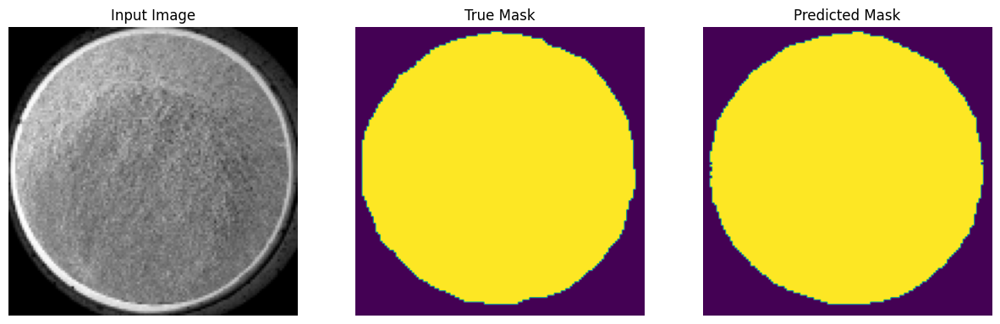


Sample Prediction after epoch 32

6/6 [==============================] - 2s 356ms/step - loss: 0.0232 - accuracy: 0.9914 - val_loss: 0.0294 - val_accuracy: 0.9888
Epoch 33/200
1/1 [==============================] - 0s 161ms/step


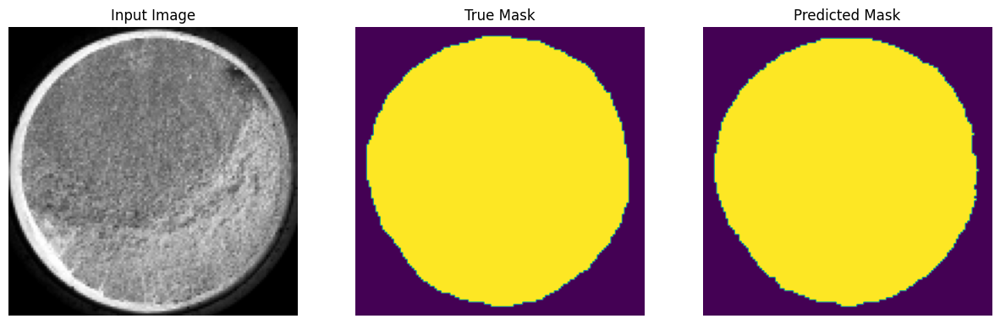


Sample Prediction after epoch 33

6/6 [==============================] - 2s 361ms/step - loss: 0.0217 - accuracy: 0.9921 - val_loss: 0.0298 - val_accuracy: 0.9886
Epoch 34/200
1/1 [==============================] - 0s 161ms/step


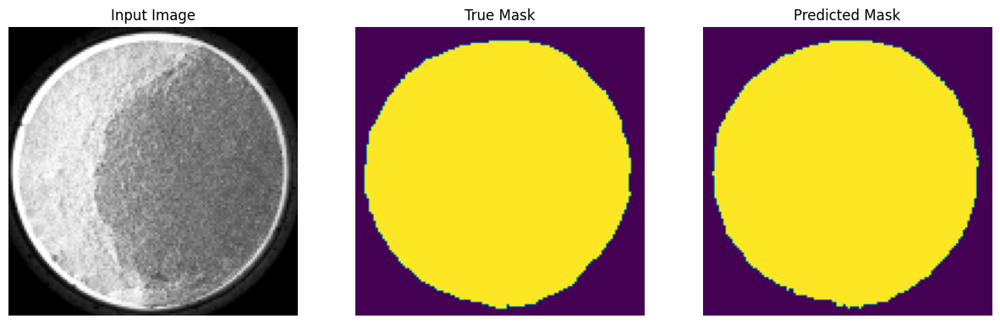


Sample Prediction after epoch 34

6/6 [==============================] - 2s 354ms/step - loss: 0.0220 - accuracy: 0.9917 - val_loss: 0.0293 - val_accuracy: 0.9889
Epoch 35/200
1/1 [==============================] - 0s 160ms/step


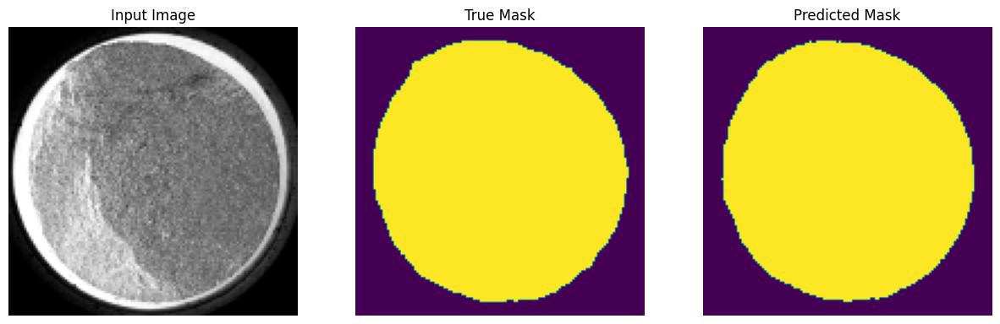


Sample Prediction after epoch 35

6/6 [==============================] - 2s 355ms/step - loss: 0.0208 - accuracy: 0.9923 - val_loss: 0.0314 - val_accuracy: 0.9881
Epoch 36/200
1/1 [==============================] - 0s 159ms/step


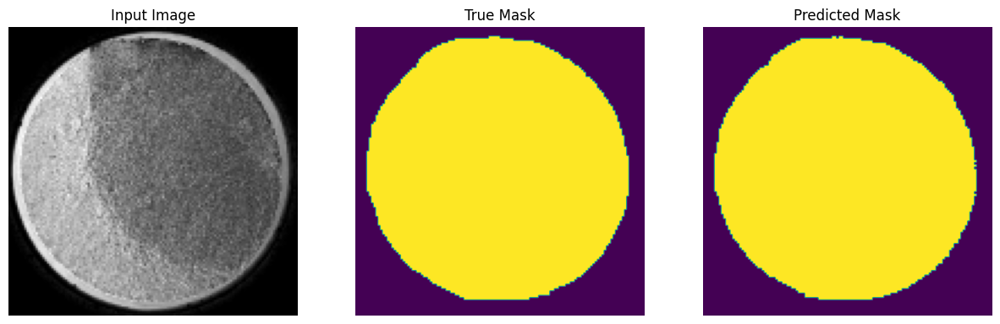


Sample Prediction after epoch 36

6/6 [==============================] - 2s 441ms/step - loss: 0.0208 - accuracy: 0.9923 - val_loss: 0.0296 - val_accuracy: 0.9890
Epoch 37/200
1/1 [==============================] - 0s 174ms/step


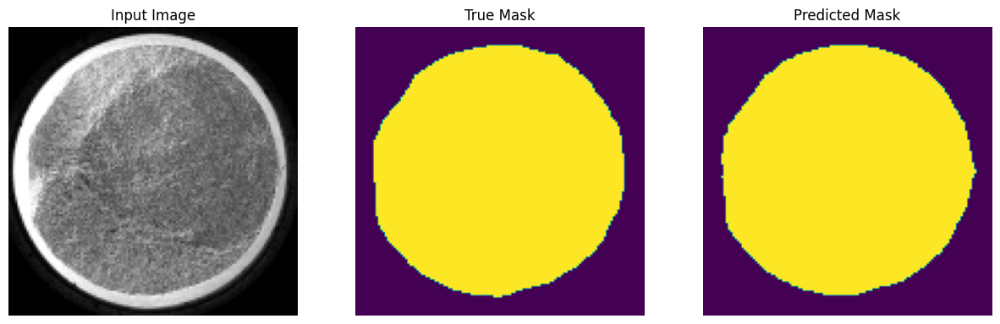


Sample Prediction after epoch 37

6/6 [==============================] - 2s 395ms/step - loss: 0.0208 - accuracy: 0.9921 - val_loss: 0.0291 - val_accuracy: 0.9889
Epoch 38/200
1/1 [==============================] - 0s 177ms/step


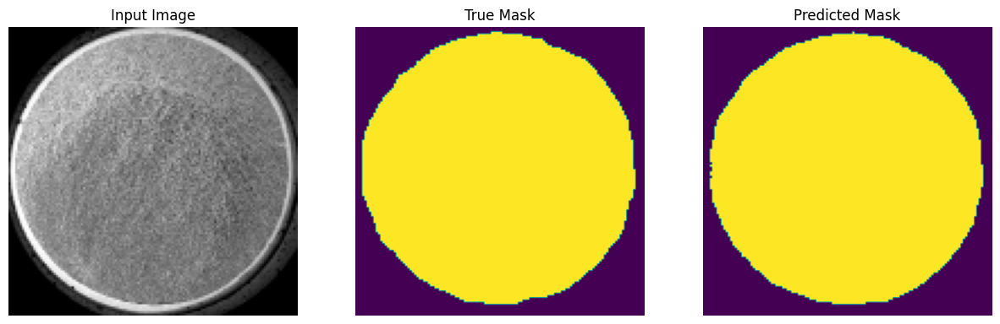


Sample Prediction after epoch 38

6/6 [==============================] - 2s 362ms/step - loss: 0.0193 - accuracy: 0.9928 - val_loss: 0.0295 - val_accuracy: 0.9889
Epoch 39/200
1/1 [==============================] - 0s 168ms/step


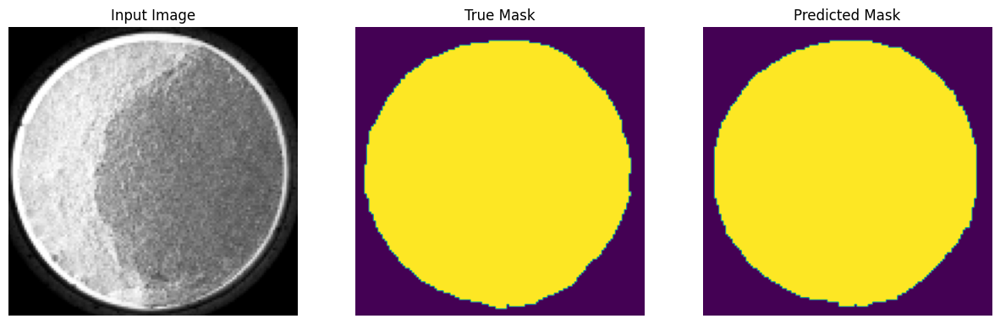


Sample Prediction after epoch 39

6/6 [==============================] - 2s 386ms/step - loss: 0.0205 - accuracy: 0.9921 - val_loss: 0.0303 - val_accuracy: 0.9887
Epoch 40/200
1/1 [==============================] - 0s 193ms/step


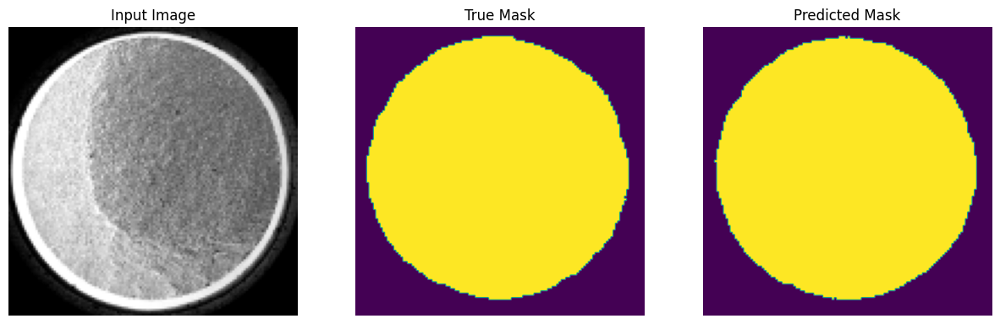


Sample Prediction after epoch 40

6/6 [==============================] - 2s 358ms/step - loss: 0.0189 - accuracy: 0.9931 - val_loss: 0.0294 - val_accuracy: 0.9889
Epoch 41/200
1/1 [==============================] - 0s 167ms/step


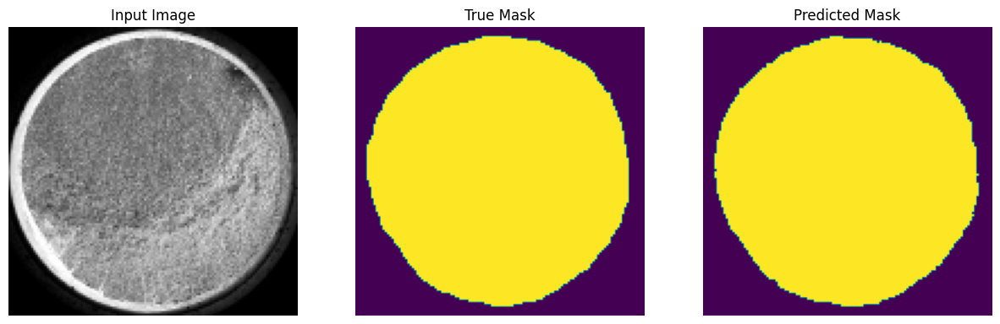


Sample Prediction after epoch 41

6/6 [==============================] - 2s 348ms/step - loss: 0.0188 - accuracy: 0.9930 - val_loss: 0.0299 - val_accuracy: 0.9889
Epoch 42/200
1/1 [==============================] - 0s 177ms/step


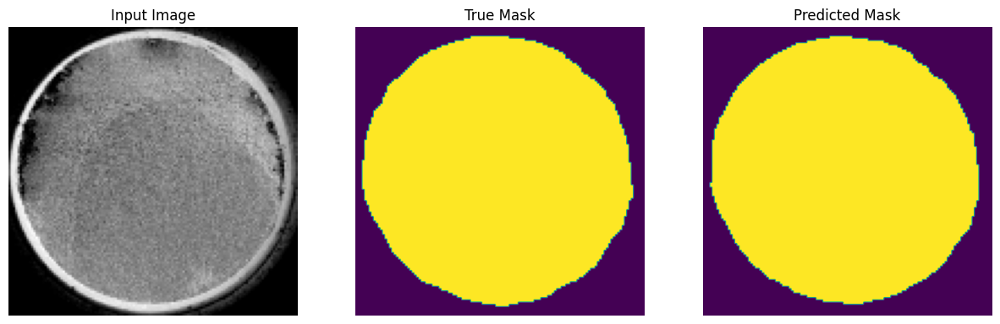


Sample Prediction after epoch 42

6/6 [==============================] - 2s 367ms/step - loss: 0.0179 - accuracy: 0.9934 - val_loss: 0.0292 - val_accuracy: 0.9890
Epoch 43/200
1/1 [==============================] - 0s 189ms/step


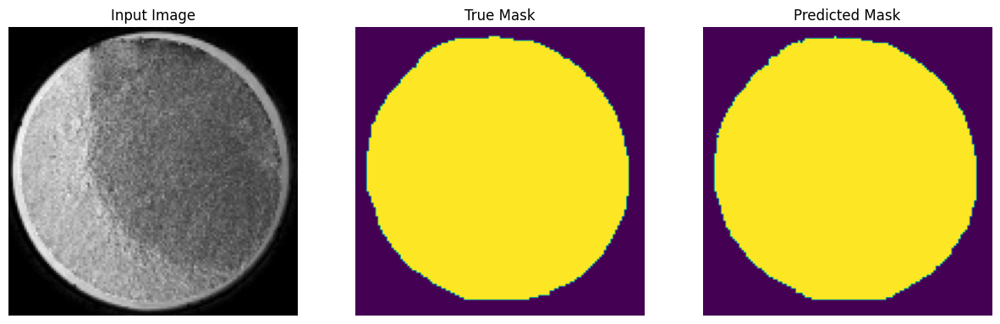


Sample Prediction after epoch 43

6/6 [==============================] - 2s 405ms/step - loss: 0.0175 - accuracy: 0.9934 - val_loss: 0.0299 - val_accuracy: 0.9889
Epoch 44/200
1/1 [==============================] - 0s 181ms/step


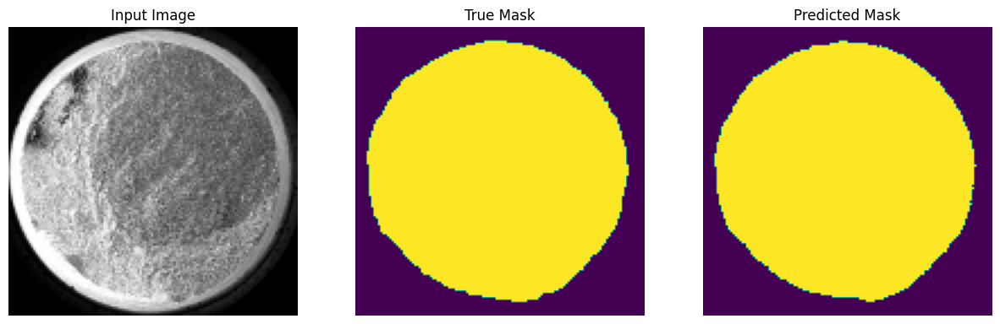


Sample Prediction after epoch 44

6/6 [==============================] - 2s 395ms/step - loss: 0.0182 - accuracy: 0.9931 - val_loss: 0.0284 - val_accuracy: 0.9893
Epoch 45/200
1/1 [==============================] - 0s 178ms/step


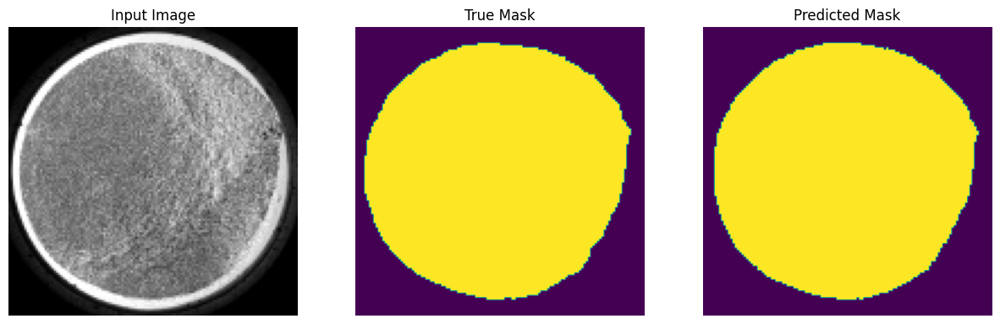


Sample Prediction after epoch 45

6/6 [==============================] - 2s 364ms/step - loss: 0.0179 - accuracy: 0.9932 - val_loss: 0.0289 - val_accuracy: 0.9891
Epoch 46/200
1/1 [==============================] - 0s 191ms/step


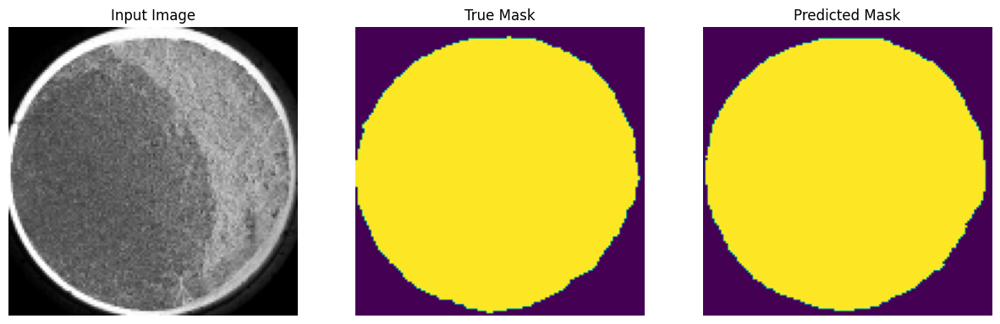


Sample Prediction after epoch 46

6/6 [==============================] - 2s 358ms/step - loss: 0.0175 - accuracy: 0.9934 - val_loss: 0.0301 - val_accuracy: 0.9888
Epoch 47/200
1/1 [==============================] - 0s 187ms/step


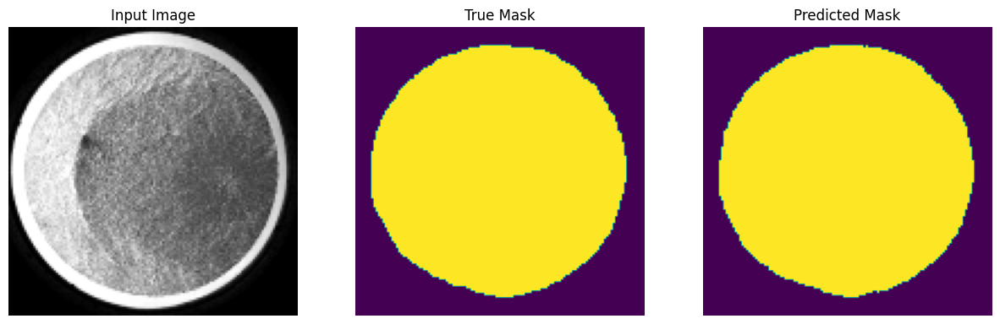


Sample Prediction after epoch 47

6/6 [==============================] - 2s 394ms/step - loss: 0.0171 - accuracy: 0.9935 - val_loss: 0.0285 - val_accuracy: 0.9891
Epoch 48/200
1/1 [==============================] - 0s 162ms/step


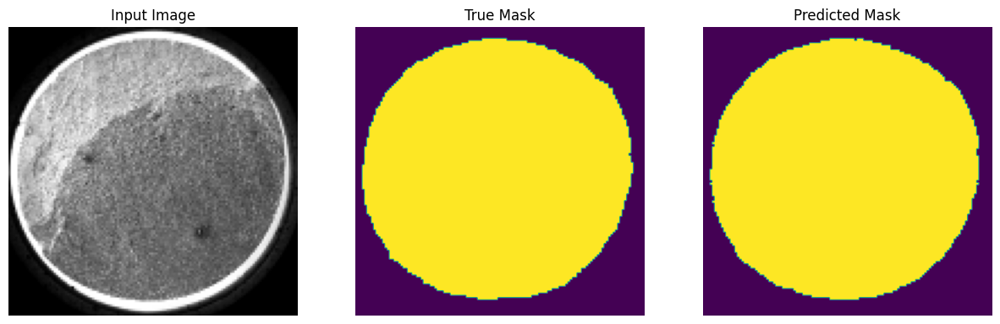


Sample Prediction after epoch 48

6/6 [==============================] - 2s 358ms/step - loss: 0.0168 - accuracy: 0.9936 - val_loss: 0.0293 - val_accuracy: 0.9891
Epoch 49/200
1/1 [==============================] - 0s 191ms/step


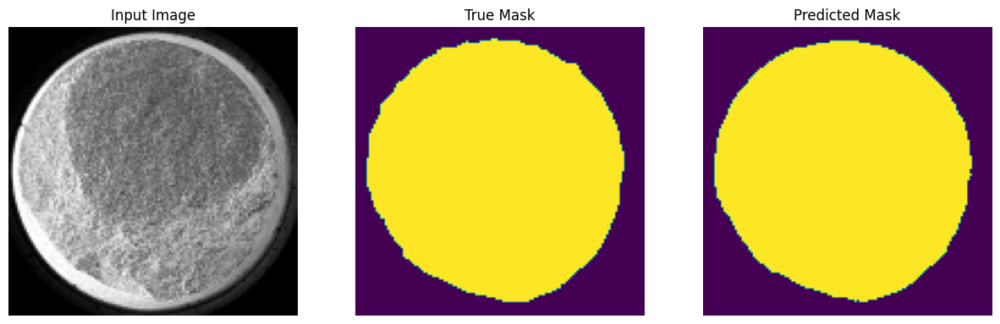


Sample Prediction after epoch 49

6/6 [==============================] - 2s 371ms/step - loss: 0.0167 - accuracy: 0.9936 - val_loss: 0.0306 - val_accuracy: 0.9885
Epoch 50/200
1/1 [==============================] - 0s 171ms/step


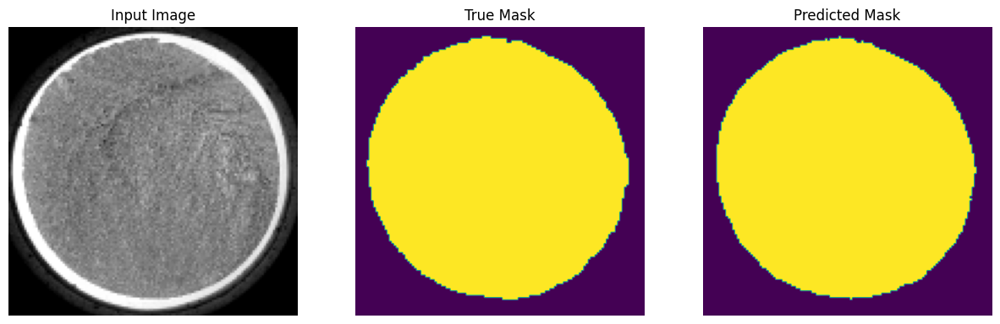


Sample Prediction after epoch 50

6/6 [==============================] - 2s 390ms/step - loss: 0.0174 - accuracy: 0.9933 - val_loss: 0.0297 - val_accuracy: 0.9889
Epoch 51/200
1/1 [==============================] - 0s 145ms/step


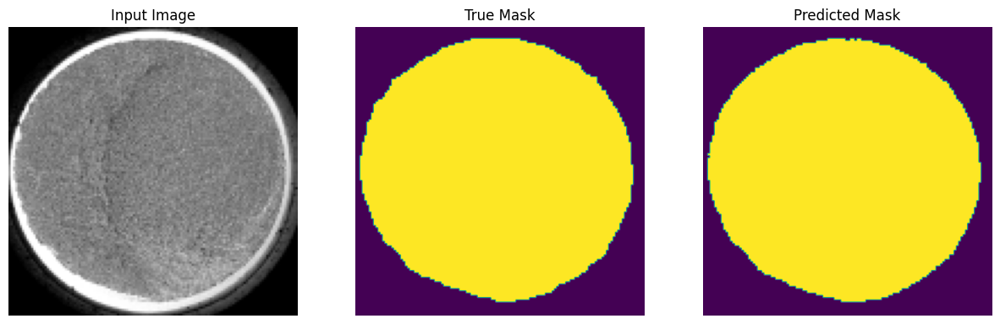


Sample Prediction after epoch 51

6/6 [==============================] - 2s 386ms/step - loss: 0.0162 - accuracy: 0.9939 - val_loss: 0.0309 - val_accuracy: 0.9886
Epoch 52/200
1/1 [==============================] - 0s 192ms/step


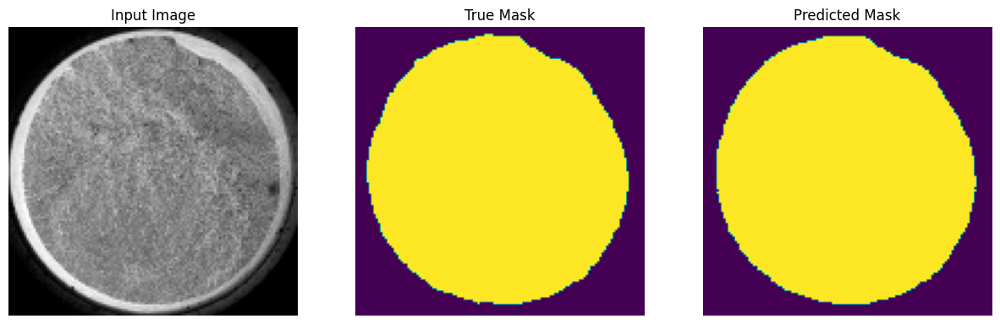


Sample Prediction after epoch 52

6/6 [==============================] - 2s 368ms/step - loss: 0.0167 - accuracy: 0.9936 - val_loss: 0.0316 - val_accuracy: 0.9884
Epoch 53/200
1/1 [==============================] - 0s 181ms/step


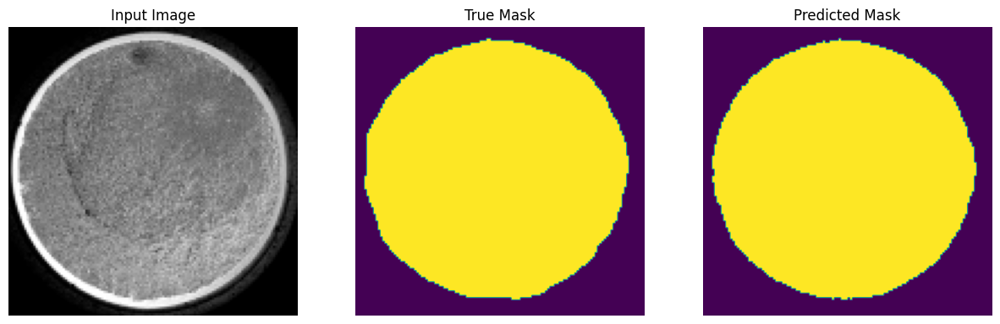


Sample Prediction after epoch 53

6/6 [==============================] - 2s 354ms/step - loss: 0.0162 - accuracy: 0.9938 - val_loss: 0.0307 - val_accuracy: 0.9886
Epoch 54/200
1/1 [==============================] - 0s 184ms/step


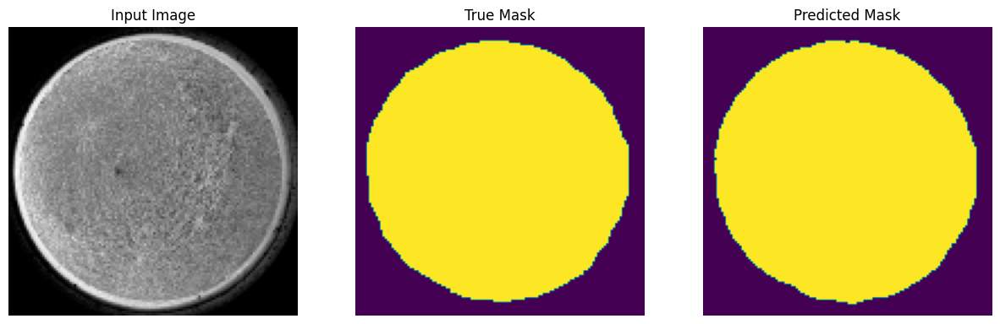


Sample Prediction after epoch 54

6/6 [==============================] - 2s 365ms/step - loss: 0.0167 - accuracy: 0.9936 - val_loss: 0.0318 - val_accuracy: 0.9885
Epoch 55/200
1/1 [==============================] - 0s 162ms/step


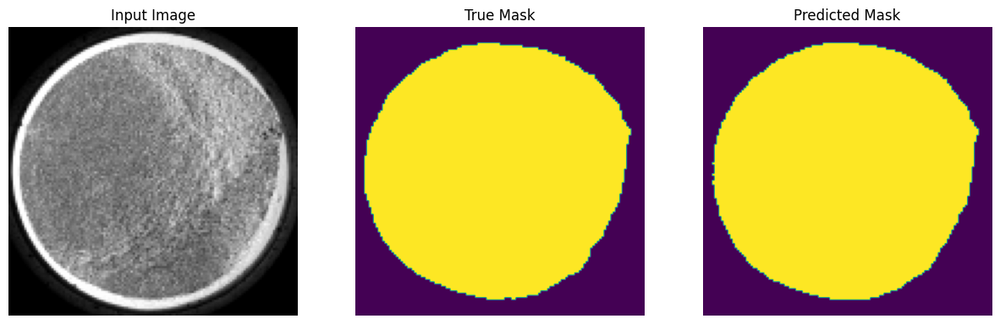


Sample Prediction after epoch 55

6/6 [==============================] - 2s 370ms/step - loss: 0.0160 - accuracy: 0.9938 - val_loss: 0.0314 - val_accuracy: 0.9887
Epoch 56/200
1/1 [==============================] - 0s 179ms/step


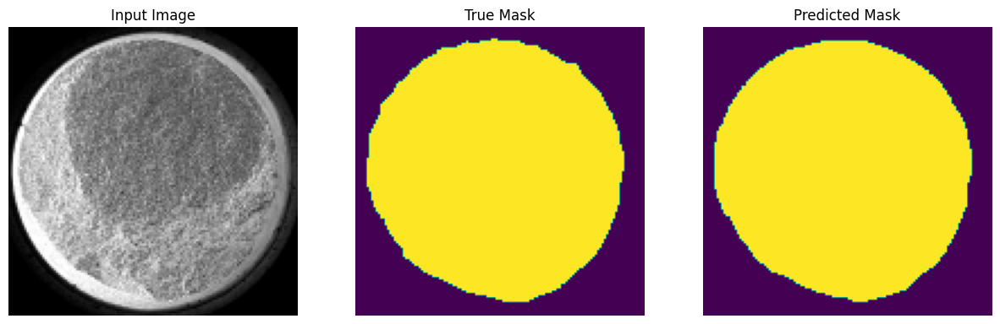


Sample Prediction after epoch 56

6/6 [==============================] - 2s 361ms/step - loss: 0.0156 - accuracy: 0.9940 - val_loss: 0.0291 - val_accuracy: 0.9893
Epoch 57/200
1/1 [==============================] - 0s 184ms/step


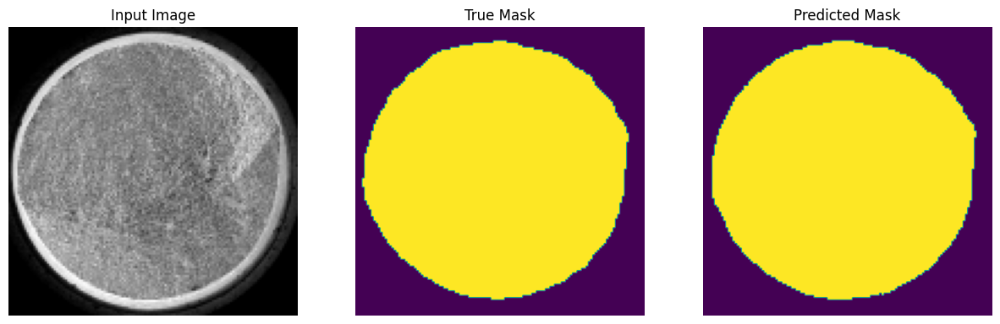


Sample Prediction after epoch 57

6/6 [==============================] - 2s 401ms/step - loss: 0.0149 - accuracy: 0.9943 - val_loss: 0.0304 - val_accuracy: 0.9888
Epoch 58/200
1/1 [==============================] - 0s 173ms/step


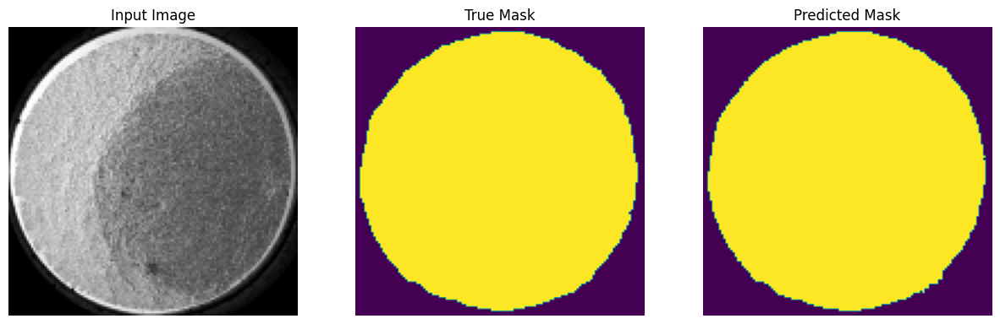


Sample Prediction after epoch 58

6/6 [==============================] - 2s 399ms/step - loss: 0.0147 - accuracy: 0.9945 - val_loss: 0.0319 - val_accuracy: 0.9883
Epoch 59/200
1/1 [==============================] - 0s 165ms/step


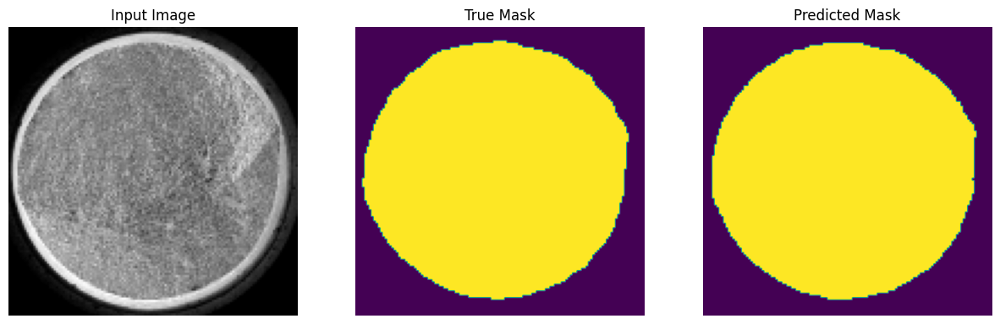


Sample Prediction after epoch 59

6/6 [==============================] - 2s 363ms/step - loss: 0.0144 - accuracy: 0.9945 - val_loss: 0.0305 - val_accuracy: 0.9887
Epoch 60/200
1/1 [==============================] - 0s 151ms/step


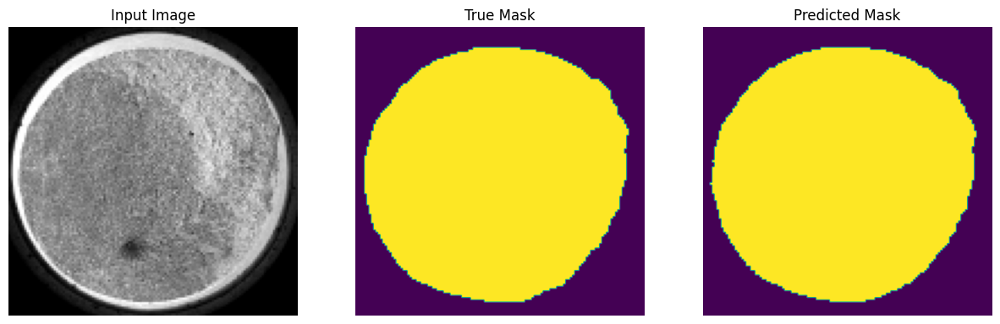


Sample Prediction after epoch 60

6/6 [==============================] - 2s 424ms/step - loss: 0.0147 - accuracy: 0.9944 - val_loss: 0.0291 - val_accuracy: 0.9892
Epoch 61/200
1/1 [==============================] - 0s 164ms/step


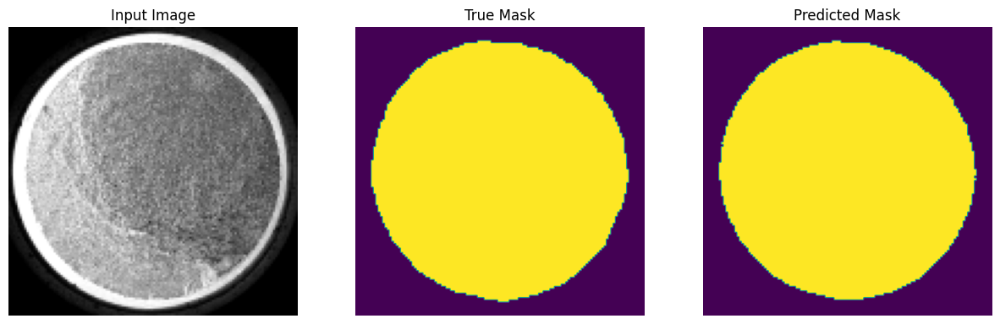


Sample Prediction after epoch 61

6/6 [==============================] - 2s 367ms/step - loss: 0.0142 - accuracy: 0.9946 - val_loss: 0.0297 - val_accuracy: 0.9892
Epoch 62/200
1/1 [==============================] - 0s 195ms/step


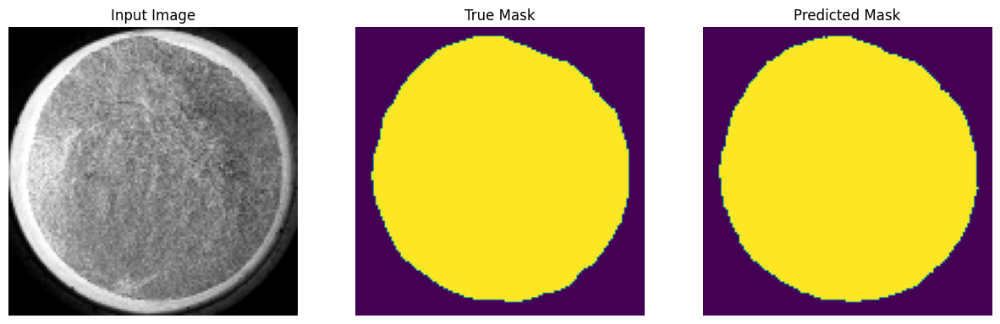


Sample Prediction after epoch 62

6/6 [==============================] - 2s 411ms/step - loss: 0.0137 - accuracy: 0.9949 - val_loss: 0.0318 - val_accuracy: 0.9886
Epoch 63/200
1/1 [==============================] - 0s 165ms/step


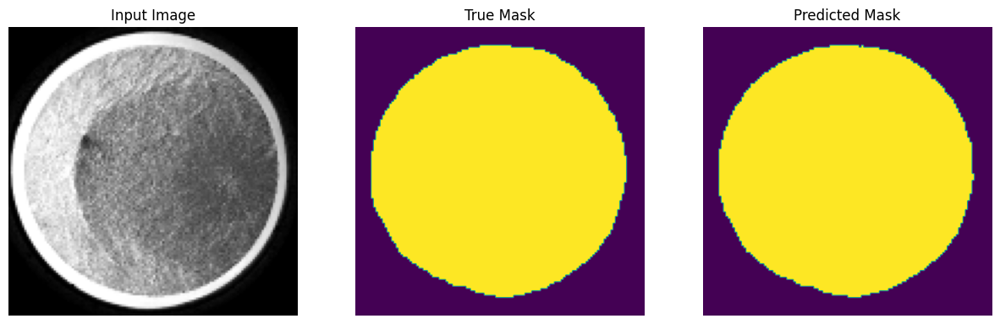


Sample Prediction after epoch 63

6/6 [==============================] - 2s 368ms/step - loss: 0.0152 - accuracy: 0.9941 - val_loss: 0.0300 - val_accuracy: 0.9888
Epoch 64/200
1/1 [==============================] - 0s 171ms/step


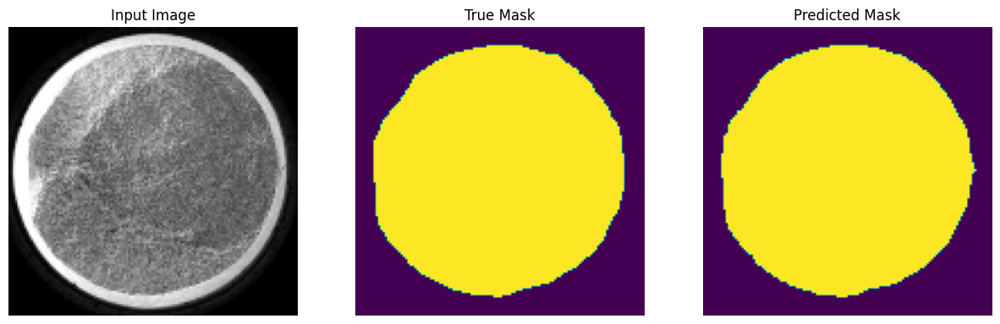


Sample Prediction after epoch 64

6/6 [==============================] - 2s 410ms/step - loss: 0.0138 - accuracy: 0.9947 - val_loss: 0.0299 - val_accuracy: 0.9891


In [86]:
from keras.callbacks import EarlyStopping
EPOCHS = 100
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test)//BATCH_SIZE
STEPS_PER_EPOCH = len(X_train)//BATCH_SIZE

EPOCHS = 200
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test) // BATCH_SIZE
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE

early_stopping = EarlyStopping(
    monitor='val_loss',  # The metric to monitor (e.g., validation loss)
    patience=20,         # Number of epochs to wait without improvement
    restore_best_weights=True  # Restore the model to the best weights
)

model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[DisplayCallback(), early_stopping])

In [87]:
# evaluate the model
model.evaluate(test_batches, verbose=1)

2/2 [==============================] - 0s 79ms/step - loss: 0.0335 - accuracy: 0.9876


[0.033502645790576935, 0.9875816702842712]

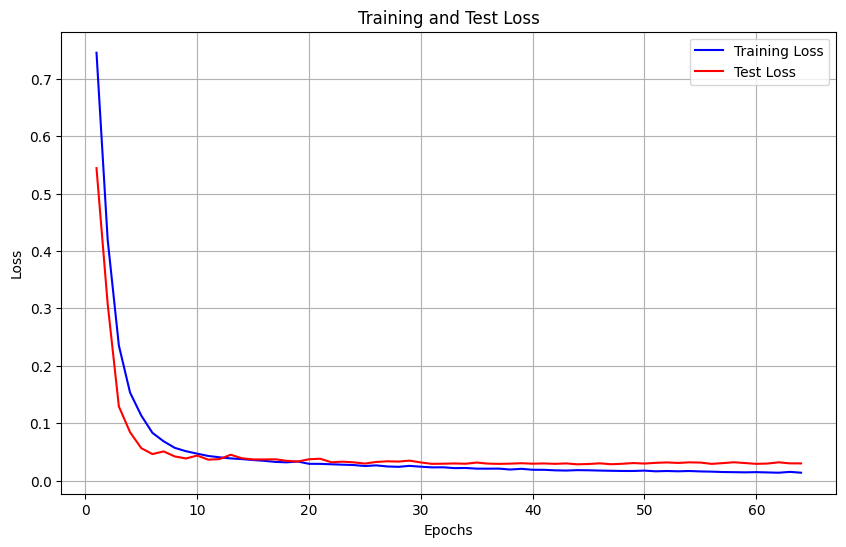

In [88]:
import matplotlib.pyplot as plt

# Extract data from the model history
train_loss = model_history.history['loss']
test_loss = model_history.history['val_loss']

# Create an array of the epoch numbers for the x-axis
epochs = range(1, len(train_loss) + 1)

# Plot the training loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, test_loss, 'r', label='Test Loss')
plt.title('Training and Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

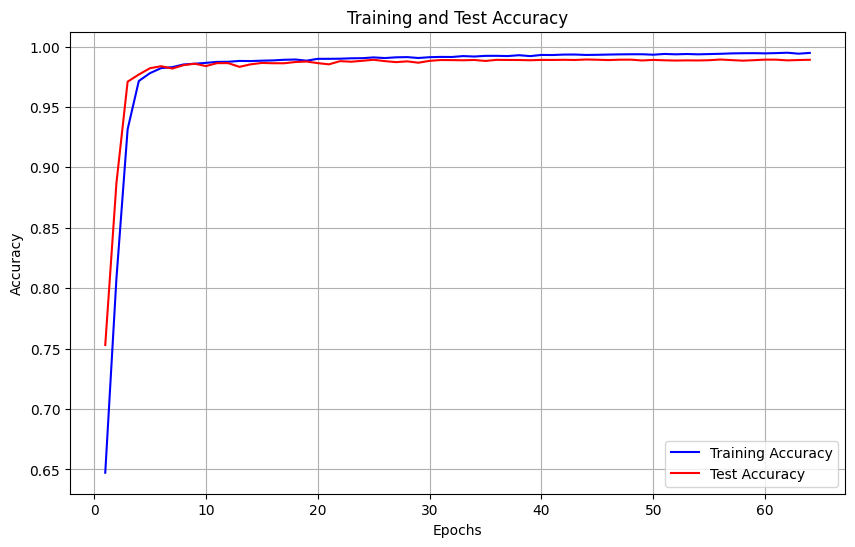

In [89]:
# Plot the training and testing accuracy
train_acc = model_history.history['accuracy']
test_acc = model_history.history['val_accuracy']

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_acc, 'b', label='Training Accuracy')
plt.plot(epochs, test_acc, 'r', label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

In [93]:
# Save the model
tf.keras.models.save_model(model, 'unet_model')

INFO:tensorflow:Assets written to: unet_model\assets


INFO:tensorflow:Assets written to: unet_model\assets
